This notebook originally started as a copy of [this](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_diffusion.ipynb) colab notebook from Huggingface. (Very little of that original notebook remains now, though.)

All sources used are credited in comments next to the relevant code.

## Our Project - Outline
1.   Choosing Foreground or Background (GPT-3) [jump to section](#scrollTo=zfo5QwqnDWVJ)
2.   Generating Mask for Target Region (foreground/background) [jump to section](#scrollTo=ppHc6cQ6D2OK)
3.   Modified Stable Diffusion Pipeline [jump to section](#scrollTo=g-DxbEGxEOts)
4. Putting it All Together [jump to section](#scrollTo=kirPS4D9g2F3)


### Choosing Foreground or Background (GPT-3)
Goal: Feed GPT-3 image descriptions for the initial and target images to identify if the changes need to primarily be made on the foreground or the background.

In [ ]:
!pip install openai

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 44 kB 2.9 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 146 kB 26.9 MB/s 
  Created wheel for openai: filename=openai-0.25.0-py3-none-any.whl size=55880 sha256=82157548a4d70212a175d3a558340b6e4b49285667a0512a1986e8f994fc2562
  Stored in directory: /root/.cache/pip/wheels/4b/92/33/6f57c7aae0b16875267999a50570e81f15eecec577ebe05a2e
Successfully built openai


In [ ]:
import openai
import string
openai.api_key = "INSERT OPEN AI API KEY HERE."
MODEL = 'text-davinci-002' # we developed the prompt using davinci-002, so that's what we're keeping in our tool.
TEMP = 0.7

In [ ]:
def foreground_background (initial_desc, target_desc):
  """
  Identify if a change from the initial image to the target image would 
  operate primarily on the foreground or background.

  Parameters:
    initial_desc: description of the initial image (string)
    target_desc: description of the target image (string)

  Returns: "foreground" or "background"

  Raises exception if foreground/background cannot be identified from descriptions.
  """
  prompt = 'Given descriptions of Image 1 and Image 2, do you think the \
foreground or the background needs to be changed to make them the same? \
Respond "Foreground" or "Background". If you are unsure or if both \
foreground and background need to change, respond with "Try a different prompt."' 
    
  for i in range(2):
    desc = [initial_desc, target_desc][i].strip() # remove trailing whitespace
    if desc[-1] in string.punctuation or desc[-1]:
      prompt += f"\nImage {i+1}: {desc[:-1]}." # remove trailing punctuation
    else:
      prompt += f"\nImage {i+1}: {desc}."

  response_text = ""
  response = None
  for _ in range(5): 
    # try 5 times. If it identifies foreground/background, move on.
    if "foreground" in response_text:
      return "foreground"
    elif "background" in response_text:
      return "background"
    response = openai.Completion.create(prompt=prompt,
      model=MODEL,
      temperature = TEMP,
      max_tokens=10,
      best_of = 5)
    response_text = response['choices'][0]['text'].strip().lower()

  # Couldn't identify foreground/background, so raise exception and ask for new prompt.
  raise Exception("Foreground/background could not be identified. Try a different prompt.")

In [ ]:
# Testing the foreground_background function
initial = "Woman standing in front of a Spirit Halloween. "
target = "A dog standing in front of a Spirit Halloween. "
print("Expected: foreground, Actual:", foreground_background(initial, target))

initial = "A dog sitting on a bench during the day"
target = "A dog sitting on a bench at night"
print("Expected: backround, Actual:", foreground_background(initial, target))

Expected: foreground, Actual: foreground
Expected: backround, Actual: foreground


### Generating Mask for Target Region (foreground/background)
Goal: Identify the pixels of the image associated with the target region (foreground or background).
- API documentation: https://rapidapi.com/api4ai-api4ai-default/api/background-removal4/details
  - note: The API has hard limit of 25 requests per API key per month (for the free subscription), so may need to switch the API key up if we pass that. 
  - IRL, maybe would just pay the $70 to get 50,000 requests/month, but this is just a proof of concept.

In [ ]:
import requests
import numpy
from PIL import Image, ImageChops
from io import BytesIO
import base64
import urllib.request
# credit to this post for helping me figure out how to read the base64 output into an image: https://stackoverflow.com/questions/26070547/decoding-base64-from-post-to-use-in-pil

In [ ]:
def generate_mask (img, region, mode="url"):
  """
  Return a mask over the target region of the initial image

  Parameters:
    img: the initial image (public url or binary file)
    region: "foreground" or "background" (string)
    mode: whether the image parameter is a url or file (string, default "url")
      - I have completely not tested if the binary file thing works. I do not really want to.

  Returns: image mask. Target region is white, rest is black. (Pillow image)
  """
  MODE = "fg_mask"
  URL = "https://background-removal4.p.rapidapi.com/v1/results?mode=fg-mask"
  API_KEY="f961082073mshb64892ab03567bbp1f1e33jsn9ec725273db8"
  mask_file = None
  response = None
  if mode == "url":
    response = requests.post(URL, 
                             data={'url':img},
                             headers={'X-RapidAPI-Key':API_KEY}).json()
  else: # image passed in as file. Honestly didn't really test this.
    response = requests.post(URL, 
                             data={'image':img},
                             headers={'X-RapidAPI-Key':API_KEY}).json()
  # print(response)

  mask_file = response['results'][0]['entities'][0]['image']
  mask_PIL = Image.open(BytesIO(base64.b64decode(mask_file))) # credit above
  # Background pixels are black, foreground pixels are white.

  if region == "foreground":
    mask_PIL = ImageChops.invert(mask_PIL)
  # If target is foreground, then background is white, foreground is black.

  mask = numpy.asarray(mask_PIL)

  return mask_PIL

In [ ]:
# test generate_mask function

bench_cat_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/4/49/White_cat_sleeping_on_a_bench.jpg/640px-White_cat_sleeping_on_a_bench.jpg"
urllib.request.urlretrieve(bench_cat_url,"benchcat.jpg")
img = Image.open("benchcat.jpg")

foreground = generate_mask(bench_cat_url, "foreground")

background = generate_mask(bench_cat_url, "background")
# urllib.request.urlretrieve('https://drive.google.com/uc?id=1i-LvWorSUGiXwckMjvXFWv_ZQ3aaRMYb',"background.png")
# background = Image.open("background.png")

Initial Image:


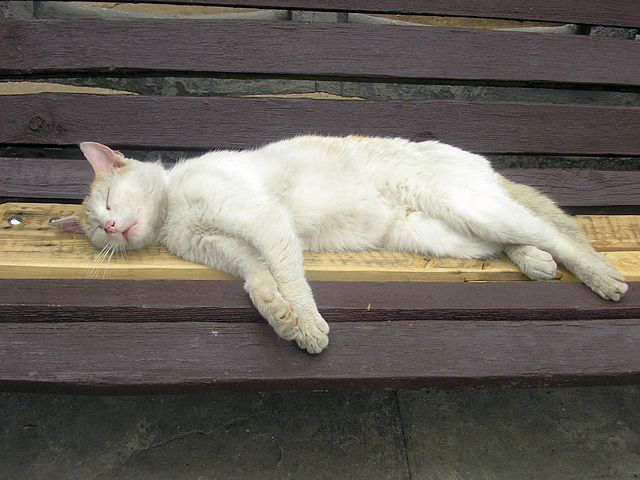

Foreground target:
Background target:


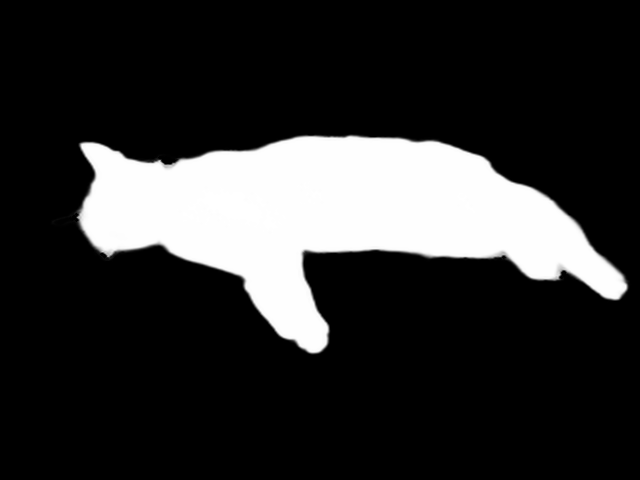

In [ ]:
print("Initial Image:")
display(img)
print("Foreground target:")
# display(foreground)
print("Background target:")
display(background)

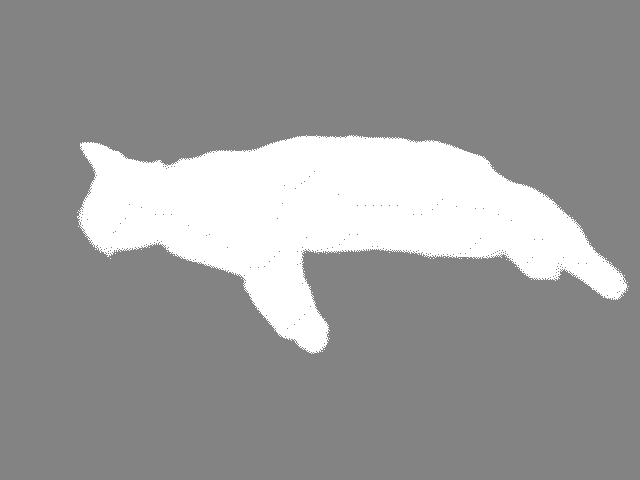

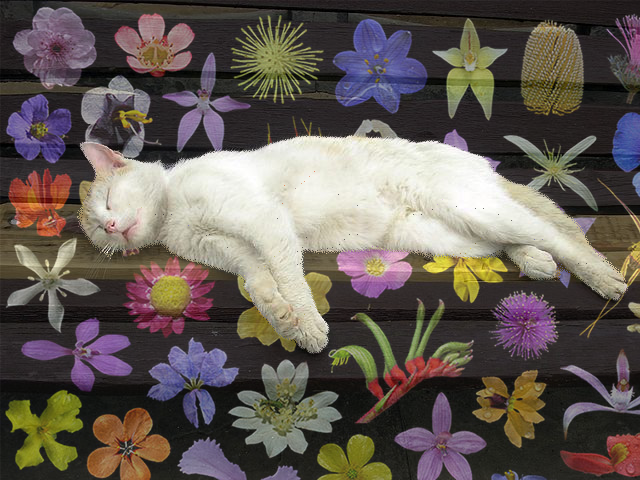

In [ ]:
# testing ways to do a transparent overlay/mask thing
urllib.request.urlretrieve("https://upload.wikimedia.org/wikipedia/commons/f/f7/Wildflowers_western_australia.jpg","flowers.jpg")
img2 = Image.open("flowers.jpg")
img2 = img2.crop((0, 0, 640, 480)) # need to crop to same size as img for composite
transparent_mask = background.convert(mode='1').convert(mode='LA') #convert to mode 1 to get binary b/w, convert to LA to add transparency

newData = []
for item in transparent_mask.getdata():
    if item[0] == 0:  # finding black colour by its RGB value
        # storing a 50% transparent value when we find a black colour
        newData.append((0, 123))
    else:
        newData.append(item)  # other colours remain unchanged
  
transparent_mask.putdata(newData)
transparent_mask = transparent_mask.convert(mode='RGBA')
display(transparent_mask) # grey is semitransparent black lol
display(Image.composite(img, img2, transparent_mask))
#composite with mask takes white-masked (anything non-black) from first image using the transparency from mask, 
# takes black-masked from second using the transparency from mask

In [ ]:
def mask_transparent (mask, transparency):
  """
  Makes the black parts of the mask transparent.

  Parameters:
    mask: mask image (Pillow Image)
    transparency: % transparency (float)
  
  Returns: transparent version of the mask image.
  """
  transparent_mask = mask.convert(mode='1').convert(mode='LA') 
  #convert to mode 1 to get binary b/w, convert to LA to add transparency
  newData = []
  for item in transparent_mask.getdata():
      if item[0] == 0:  # finding black colour by its RGB value
          # storing a transparent value when we find a black colour
          newData.append((0, int(256*transparency)))
      else:
          newData.append(item)  # other colours remain unchanged
    
  transparent_mask.putdata(newData)
  transparent_mask = transparent_mask.convert(mode='RGBA')
  return transparent_mask

### Modified Stable Diffusion Pipeline
Goal: Run stable diffusion on the input image using the target image description, like img-2-img, but only apply noise to the target region of the image.

1. create latent noise encoding and convert to noise image using VAE decoder
  - noise could just be created using Pillow? https://pillow.readthedocs.io/en/stable/reference/Image.html#PIL.Image.effect_noise
2. apply foreground/background mask to decoded noise image
3. put masked noise image over input image (play with opacity or whatever)
4. encode noisy masked image using VAE encoder
5. run stable diffusion denoising to generate a new image




First, install the necessary libraries:

In [ ]:
# https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_diffusion.ipynb
!pip install diffusers==0.4.0
!pip install transformers scipy ftfy
!pip install "ipywidgets>=7,<8"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 229 kB 13.8 MB/s 
     |████████████████████████████████| 182 kB 59.4 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.5 MB 14.1 MB/s 
     |████████████████████████████████| 53 kB 1.2 MB/s 
     |████████████████████████████████| 7.6 MB 55.9 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 13.6 MB/s 


Setup for the modified Stable Diffusion structure:

In [ ]:
# https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_diffusion.ipynb
import torch
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel
from diffusers import LMSDiscreteScheduler
import random
import gc

torch_device = "cuda" if torch.cuda.is_available() else "cpu"

# 1. Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# 2. Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

# Load a K-LMS scheduler instead of pre-defined
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=500)

# Move models to GPU
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device) 

num_inference_steps = 50           # Number of denoising steps

guidance_scale = 7.5                # Scale for classifier-free guidance

# generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise

generator = torch.Generator("cuda")#.manual_seed(0).to(torch_device)

scheduler.set_timesteps(num_inference_steps)

batch_size = 1

ORT_TO_NP_TYPE = {
    "tensor(bool)": numpy.bool_,
    "tensor(int8)": numpy.int8,
    "tensor(uint8)": numpy.uint8,
    "tensor(int16)": numpy.int16,
    "tensor(uint16)": numpy.uint16,
    "tensor(int32)": numpy.int32,
    "tensor(uint32)": numpy.uint32,
    "tensor(int64)": numpy.int64,
    "tensor(uint64)": numpy.uint64,
    "tensor(float16)": numpy.float16,
    "tensor(float)": numpy.float32,
    "tensor(double)": numpy.float64,
}
strength = 0.2
order = 4

Downloading:   0%|          | 0.00/335M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/522 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/961k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/389 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/905 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.52k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.6.layer_norm2.bias', 'vision_model.encoder.layers.13.mlp.fc1.bias', 'vision_model.encoder.layers.19.layer_norm2.weight', 'vision_model.encoder.layers.22.self_attn.q_proj.bias', 'vision_model.encoder.layers.7.layer_norm1.bias', 'vision_model.encoder.layers.10.self_attn.q_proj.weight', 'vision_model.encoder.layers.8.layer_norm1.weight', 'vision_model.encoder.layers.16.self_attn.k_proj.weight', 'vision_model.encoder.layers.13.mlp.fc1.weight', 'vision_model.encoder.layers.17.self_attn.q_proj.bias', 'vision_model.encoder.layers.19.self_attn.q_proj.weight', 'vision_model.encoder.layers.8.mlp.fc1.bias', 'vision_model.encoder.layers.14.mlp.fc2.weight', 'vision_model.encoder.layers.15.mlp.fc2.weight', 'vision_model.encoder.layers.11.mlp.fc1.weight', 'vision_model.encoder.layers.10.self_attn.k_proj.weight', 'vision_model.encoder.layers.1.self_attn.k_p

Downloading:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/743 [00:00<?, ?B/s]

In [ ]:
# used to periodically free up GPU RAM. 
# Probably not necessary now, but we were having a lot of issues with running out of memory before.
def clean_memory():
  gc.collect()
  torch.cuda.empty_cache()

Creating noise and applying it to the image:

In [ ]:
# generates noisy latent vectors using torch.randn and scheduler.init_noise_sigma (from Stable Diffusion)
def create_noise(batch_size, channels, size):
  # generator = torch.Generator("cuda").manual_seed(0)
  latents = torch.randn(
    (batch_size, channels, size[1] // 8, size[0] // 8),
    generator = generator, device=torch_device
  )
  latents = latents.to(torch_device)
  latents = latents * scheduler.init_noise_sigma
  #clean_memory()
  return latents


In [ ]:
from torch.cuda.amp import autocast

# from https://colab.research.google.com/drive/1Ci1VYHuFJK5eOX9TB0Mq4NsqkeDrMaaH
# converts image into latent vectors using vae
@torch.no_grad()
def to_latents(img:Image):
  #clean_memory()
  np_img = (numpy.array(img).astype(numpy.float32) / 255.0) * 2.0 - 1.0
  np_img = np_img[None].transpose(0, 3, 1, 2)
  torch_img = torch.from_numpy(np_img)
  with autocast():
    # generator = torch.Generator("cuda").manual_seed(0)
    latents = vae.encode(torch_img.to(vae.dtype).to(torch_device)).latent_dist.sample(generator=generator)
  return latents #0.18215 * latents

# from https://colab.research.google.com/drive/1Ci1VYHuFJK5eOX9TB0Mq4NsqkeDrMaaH
# converts latent vectors into image using vae
@torch.no_grad()
def to_img(latents):
  #clean_memory()
  # latents = 1 / 0.18215 * latents
  with autocast():
    torch_img = vae.decode(latents.to(vae.dtype).to(torch_device)).sample
  torch_img = (torch_img / 2 + 0.5).clamp(0, 1)
  np_img = torch_img.cpu().permute(0, 2, 3, 1).detach().numpy()[0]
  np_img = (np_img * 255.0).astype(numpy.uint8)
  img = Image.fromarray(np_img)
  return img

# some from https://github.com/huggingface/diffusers/blob/main/src/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py
# applies noise to image using scheduler.add_noise (from stable diffusion)
def apply_noise(init_image,noise, strength):
  init_latents = to_latents(init_image).to(torch_device)
  offset = scheduler.config.get("steps_offset", 0) #no clue what this is
  init_timestep = int(num_inference_steps * strength) + offset
  init_timestep = min(init_timestep, num_inference_steps)
  steps = scheduler.timesteps.numpy()[-init_timestep]
  steps = numpy.array([steps] * batch_size * 1)
  init_latents = scheduler.add_noise(init_latents, noise, torch.from_numpy(steps))
  latents = init_latents
  return  0.18215 * latents

In [ ]:
## Apply noise to initial image with mask, using PIL.Image.composite and apply_noise
def mask_noise(img, url, region, transparency=0.1):
  """
  Generate noise, get mask of region, and apply to the image.

  Parameters:
    img: pillow loaded initial image? (Pillow image)
    url: url to the image? (string)
    region: "foreground" or "background" (string)

  Returns: Masked image (Pillow image)
  """
  #clean_memory()
  noise_latents = create_noise(batch_size, unet.in_channels, img.size)
  noise_img = to_img(noise_latents)
  # display(noise_img)
  mask = generate_mask(url, region=region)
  # mask = Image.open("background.png")

  # mask_np = numpy.asarray(mask)
  # noise_np = numpy.asarray(noise_img)
  # mask_np[mask_np==1] = noise_np

  # display(mask)
  # transparent_mask = mask_transparent(mask, transparency)
  # display(transparent_mask)
  masked_noise = Image.composite(img, noise_img, mask) #combines the image and noise directly
  # display(masked_noise)

  composite = apply_noise(img, to_latents(masked_noise), transparency) #runs apply_noise to mush the original image with the image + noise
  composite_img = to_img(composite)
  # display(composite_img)

  noisy = to_latents(composite_img)

  return noisy

In [ ]:
# combines noise and image by iterating over pixels and addding pixels from noise and image according to the mask.
def combine_noise_img(img, noise, mask):
  # iterate over mask in 8x8 blocks
  combined = torch.zeros_like(img) # new latents of same size
  for w in range(0,mask.width,8):
    for h in range(0,mask.height,8):
      px = mask.getpixel((w,h))
      trans = px[3] / 256 # floating point transparency value of pixel
      for k in range(4):
        n = noise[0][k][h//8][w//8]
        i = img[0][k][h//8][w//8]
        combined[0][k][h//8][w//8] = n*(1-trans) + i*trans
  return combined

In [ ]:
#used to generate baseline performance where some of the noise pixels were randomly set to 0
def edit_noise(noise, val=0.01):
  for k in range(4):
    for i in range(noise.size(2)//2):
      for j in range(noise.size(3)//2):
        if random.random() < val:
          noise[0][k][i][j] = 0
  return noise

Extracting text embeddings from target image description:

In [ ]:
# referenced from https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_diffusion.ipynb
def get_text_embeddings(prompt):
  #clean_memory()
  text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")

  with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
  max_length = text_input.input_ids.shape[-1]
  uncond_input = tokenizer(
      [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
  )
  with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]   
  text_embeddings = torch.cat([uncond_embeddings, text_embeddings])
  return text_embeddings

De-noising function:

In [ ]:
# referenced from https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_diffusion.ipynb
# and https://github.com/huggingface/diffusers/blob/main/src/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py
from tqdm.auto import tqdm

def run_denoising(text_embeddings, latents, strength=0.8):
  #clean_memory()

  offset = scheduler.config.get("steps_offset", 0) #no clue what this is
  init_timestep = int(num_inference_steps * strength) + offset
  init_timestep = min(init_timestep, num_inference_steps)
  t_start = max(num_inference_steps - init_timestep + offset, 0)
  timesteps = scheduler.timesteps[t_start:]

  # timestep_dtype = next(
  #           (input.type for input in unet.get_inputs() if input.name == "timestep"), "tensor(float)"
  #       )
  # timestep_dtype = ORT_TO_NP_TYPE[timestep_dtype] #no idea what this does
  
  num_warmup_steps = len(timesteps) - num_inference_steps * order
  for t in tqdm(timesteps):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)
    # latent_model_input = latents
    latent_model_input = scheduler.scale_model_input(latent_model_input, t)
    # latent_model_input = scheduler.scale_model_input(torch.from_numpy(latent_model_input), t)
    # latent_model_input = latent_model_input.cpu().numpy()
    
    # predict the noise residual
    with torch.no_grad():
      # timestep = numpy.array([t], dtype=timestep_dtype)
      # noise_pred = unet(
      #           sample=latent_model_input, timestep=timestep, encoder_hidden_states=text_embeddings
      #       )[0]
      noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    # perform guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler.step(noise_pred, t, latents).prev_sample
    # display(to_img(latents))
    # display(to_img(1 / 0.18215* latents))

  # scale and decode the image latents with vae
  latents = latents #1 / 0.18215 * latents
  
  return latents

### Putting it all together
Goal: 
Test the modified Stable Diffusion pipeline (encoding, noise adding, and decoding) together, along with the rest of our tool (foreground/background identification and masking):

In [ ]:
# Open the sample image from the url and set the initial image description and target image description.
# The initial image can be changed by using a different url or loading the image directly in some other way, as long as the PIL image ends up stored to the variabe img.
initial_image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/4/49/White_cat_sleeping_on_a_bench.jpg/640px-White_cat_sleeping_on_a_bench.jpg"
urllib.request.urlretrieve(bench_cat_url,"initial_image.jpg")
img = Image.open("initial_image.jpg")

# These image discriptions can be changed directly here.
initial = "White cat sleeping on a bench" # From the image title
target = "A cat lying in a field of flowers" # manually generated

In [ ]:
# Some hyperparameters for our pipeline
num_inference_steps = 20
scheduler.set_timesteps(num_inference_steps)
strength = 0.8

combined image + noise: 


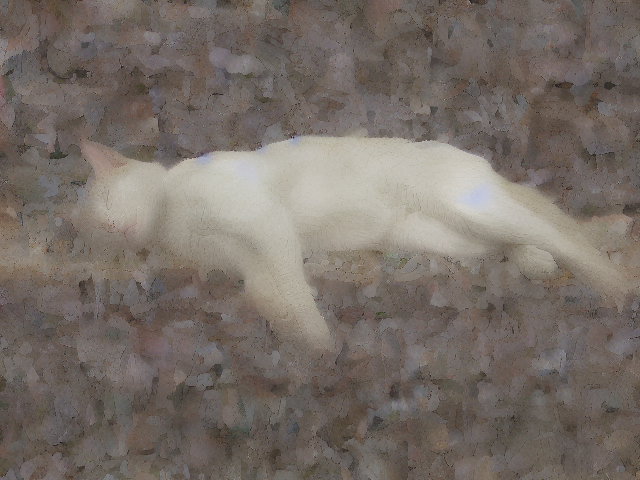

running denoising:


  0%|          | 0/16 [00:00<?, ?it/s]

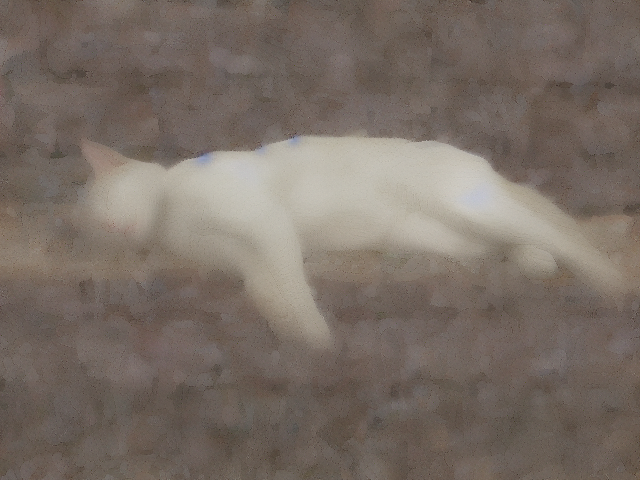

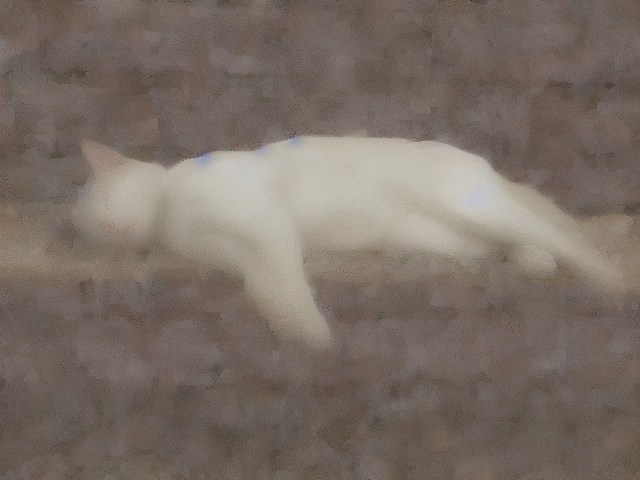

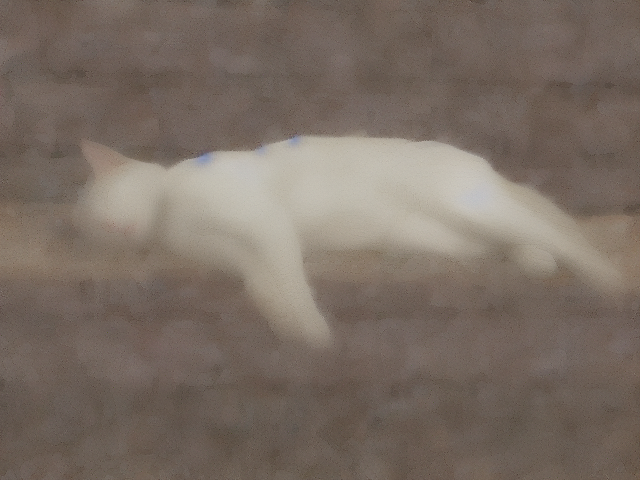

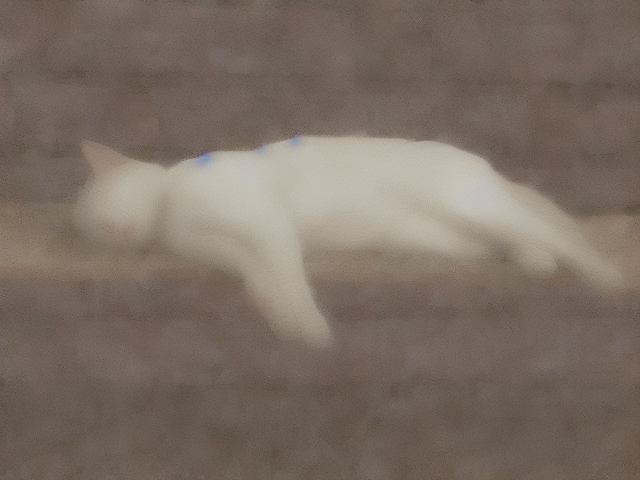

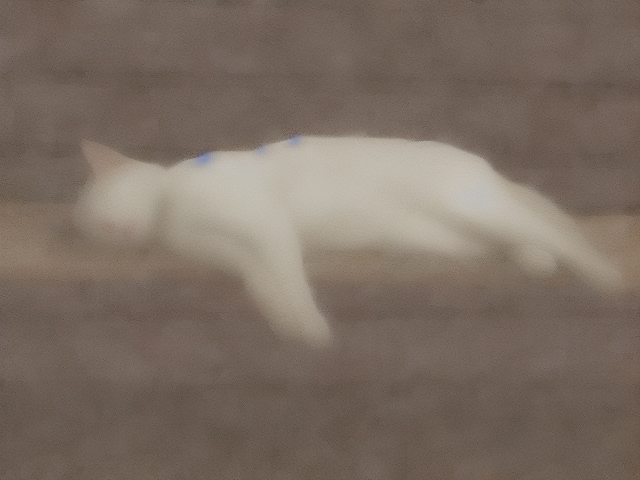

...

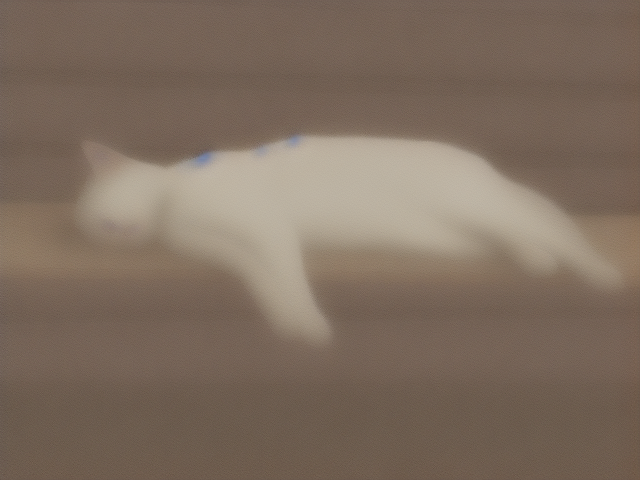

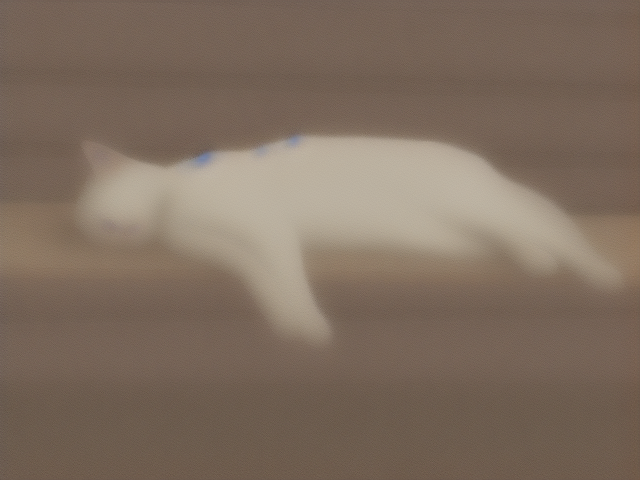

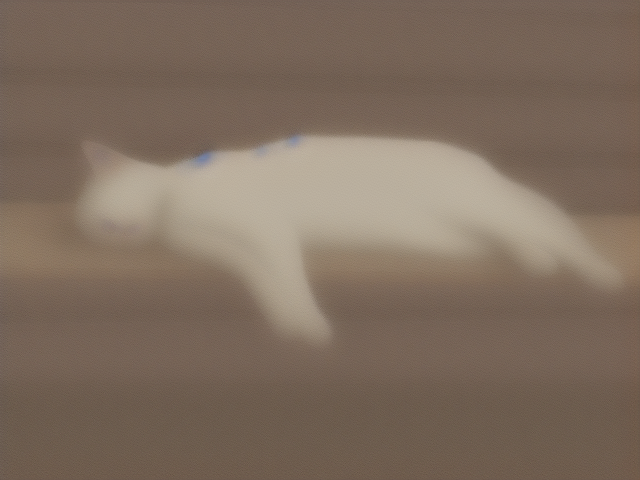

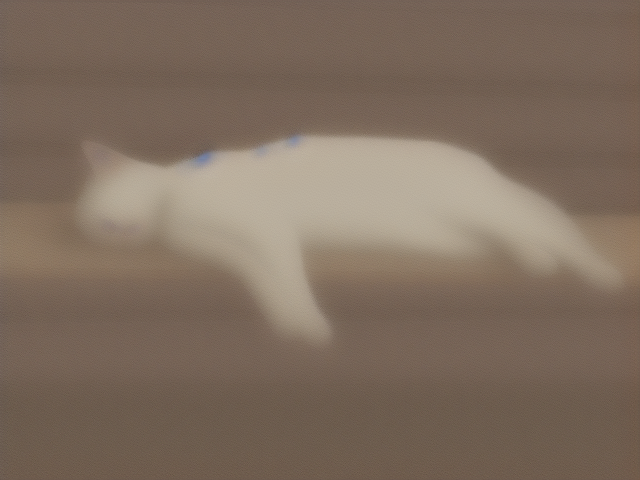

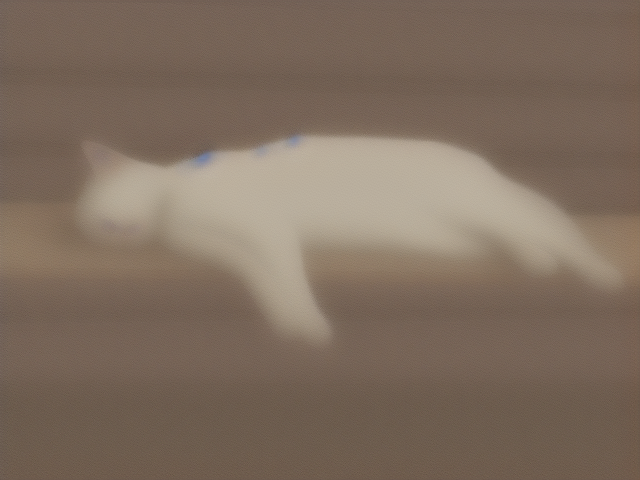

In [ ]:
# Identify whether foreground or background should be changed
region = foreground_background(initial, target)

# Generate the mask and add noise to the image.
combined = mask_noise(img, initial_image_url, region, transparency=strength)
print('combined image + noise: ')
init_combined_img = to_img(combined)
display(init_combined_img)

# Run the modified Stable Diffusion pipeline.
print('Running denoising:')
prompt = [target]
embedding = get_text_embeddings(prompt)
image = run_denoising(embedding,combined, strength=strength)

# Display the output image
print("Final image output:")
image_out = to_img(image)
display(image_out)

In [ ]:
clean_memory()

In [ ]:
!nvidia-smi

Thu Dec  1 07:22:57 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   56C    P0    36W /  70W |   8124MiB / 15109MiB |     28%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------